# Imports and Global variables

In [14]:
import matplotlib
import mat73

import __libpath

from psychelibrary.nic_dataset_tools import *

# Labels Exploration

## Mat files

In [15]:
mat_dir_rel = "fCWT (not used)/"
mat_dir = os.path.join(DATASET_DIR, mat_dir_rel)

mat00 = mat73.loadmat(DATASET_DIR + 'fCWT (not used)/devel_00.wav _fcwt_tfm_breath.mat')

In [16]:
mat00

{'fcwt_tfm_sig': array([[  592.236  ,   677.89075,   607.34265, ..., 10830.226  ,
         18711.215  , 25240.074  ],
        [  687.2088 ,   781.9462 ,   694.57367, ..., 11781.088  ,
         20731.86   , 28156.275  ],
        [  794.4201 ,   898.31165,   790.74493, ..., 12732.836  ,
         22840.768  , 31232.281  ],
        ...,
        [ 2044.1989 ,  2045.119  ,  2046.0404 , ...,  1360.1329 ,
          1359.8145 ,  1359.4946 ],
        [ 2172.3503 ,  2173.166  ,  2173.9832 , ...,  1544.9385 ,
          1544.6321 ,  1544.3253 ],
        [ 1544.0215 ,  1543.7188 ,  1543.4146 , ...,     0.     ,
             0.     ,     0.     ]], dtype=float32)}

The mat files appear to contain fast Continuous Wavelet Transform (fCWT)s of the audios.

## Labels of breathing

In [17]:
BREATH_DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294000 entries, 0 to 293999
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   filename    294000 non-null  object 
 1   timeFrame   294000 non-null  float64
 2   upper_belt  198000 non-null  float64
dtypes: float64(2), object(1)
memory usage: 6.7+ MB


The test_ files don't have the breathing labels, those are the null values.

In [18]:
BREATH_DF.head()

,filename,timeFrame,upper_belt
0,devel_00.wav,0.00,0.08275
1,devel_00.wav,0.04,0.14380
2,devel_00.wav,0.08,0.06386
3,devel_00.wav,0.12,0.00560
4,devel_00.wav,0.16,-0.03033


In [19]:
print(BREATH_DF['filename'].unique())

['devel_00.wav' 'devel_01.wav' 'devel_02.wav' 'devel_03.wav'
 'devel_04.wav' 'devel_05.wav' 'devel_06.wav' 'devel_07.wav'
 'devel_08.wav' 'devel_09.wav' 'devel_10.wav' 'devel_11.wav'
 'devel_12.wav' 'devel_13.wav' 'devel_14.wav' 'devel_15.wav' 'test_00.wav'
 'test_01.wav' 'test_02.wav' 'test_03.wav' 'test_04.wav' 'test_05.wav'
 'test_06.wav' 'test_07.wav' 'test_08.wav' 'test_09.wav' 'test_10.wav'
 'test_11.wav' 'test_12.wav' 'test_13.wav' 'test_14.wav' 'test_15.wav'
 'train_00.wav' 'train_01.wav' 'train_02.wav' 'train_03.wav'
 'train_04.wav' 'train_05.wav' 'train_06.wav' 'train_07.wav'
 'train_08.wav' 'train_09.wav' 'train_10.wav' 'train_11.wav'
 'train_12.wav' 'train_13.wav' 'train_14.wav' 'train_15.wav'
 'train_16.wav']


In [20]:
BREATH_DF.loc[BREATH_DF['filename'] == 'devel_00.wav']

,filename,timeFrame,upper_belt
0,devel_00.wav,0.00,0.08275
1,devel_00.wav,0.04,0.14380
2,devel_00.wav,0.08,0.06386
3,devel_00.wav,0.12,0.00560
4,devel_00.wav,0.16,-0.03033
...,...,...,...
5995,devel_00.wav,239.80,0.80553
5996,devel_00.wav,239.84,0.70143
5997,devel_00.wav,239.88,0.53927
5998,devel_00.wav,239.92,0.47323


In [21]:
BREATH_DF.groupby(by="filename")['timeFrame'].max()

filename
devel_00.wav    239.96
devel_01.wav    239.96
devel_02.wav    239.96
devel_03.wav    239.96
devel_04.wav    239.96
devel_05.wav    239.96
devel_06.wav    239.96
devel_07.wav    239.96
devel_08.wav    239.96
devel_09.wav    239.96
devel_10.wav    239.96
devel_11.wav    239.96
devel_12.wav    239.96
devel_13.wav    239.96
devel_14.wav    239.96
devel_15.wav    239.96
test_00.wav     239.96
test_01.wav     239.96
test_02.wav     239.96
test_03.wav     239.96
test_04.wav     239.96
test_05.wav     239.96
test_06.wav     239.96
test_07.wav     239.96
test_08.wav     239.96
test_09.wav     239.96
test_10.wav     239.96
test_11.wav     239.96
test_12.wav     239.96
test_13.wav     239.96
test_14.wav     239.96
test_15.wav     239.96
train_00.wav    239.96
train_01.wav    239.96
train_02.wav    239.96
train_03.wav    239.96
train_04.wav    239.96
train_05.wav    239.96
train_06.wav    239.96
train_07.wav    239.96
train_08.wav    239.96
train_09.wav    239.96
train_10.wav    239.96
tr

All recordings have 4 minutes of recording.

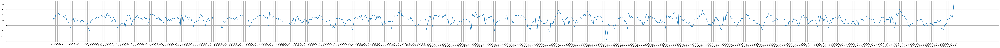

In [22]:
filename = 'devel_00.wav'
df = BREATH_DF.loc[BREATH_DF['filename'] == filename]

plt.figure(figsize=(120,5))
plt.plot(df['timeFrame'], df['upper_belt'])
plt.xticks(np.arange(min(df['timeFrame']), max(df['timeFrame'])+1, 0.5), rotation = 45)
plt.grid(True)
plt.show()

ipd.Audio(WAVS_DIR + filename)

# Audio exploration

In [23]:
ndt.ALIGNER = 'gentle_aligner'

In [24]:
devel_00_json = get_file_json('devel_00.wav', 'sorted_aligned_ibm/json/')

FileNotFoundError: [Errno 2] No such file or directory: 'D:/OneDrive - Universiteit Utrecht/Documents/000 - Documenti/PROJECTS/PSYCHE/Dataset/INTERSPEECH/ComParE2020_Breathing/transcriptions/sorted_aligned_ibm/json/devel_00.json'

An example of how to access words of the transcript with their data, audio and timestamps:

Access words:

In [ ]:
i=15 # word number

access_word(i, 'devel_00.wav', devel_00_json)

Example to access the pause between word i and i+1:

In [ ]:
i = 64
    
word1, word2 = access_consecutive_words(i, devel_00_json)
print_spaced_words(word1, word2, 'devel_00.wav', original_audio=True)

# Search for breathings

## Actual search for breathings

In [ ]:
search_breath_analysis('devel_00.wav', devel_00_json)

Again, for reference, the audio

In [ ]:
ipd.Audio(WAVS_DIR + filename)

In [ ]:
seconds_2_index(34, devel_00_json)

## Considerations on breathings

The breathing signal is taken from the chest. This means that IF THE SUBJECT IS BREATHING MORE FROM THE BELLY, the chest is going to be depressed, decreasing therefore the signal amplitude.

There is a trend noticeable in the first subject about this, but it might be led by the fact that the inspirations of the subject are always preceded by expirations after the word to free up completely the lungs before inspiring. This causes the signal to have the form of a saddle during the breathing pauses.

An example of this:

In [ ]:
i = 11
    
word1, word2 = access_consecutive_words(i, devel_00_json)
print_spaced_words(word1, word2, 'devel_00.wav')

In other cases though, it seems that the subject's breathing brings the signal significantly down without coming back up during what seems to be an inspiration. I hypotize that this subject has a tends to breath from the belly.

Example:

In [ ]:
i = 81
word1, word2 = access_consecutive_words(i, devel_00_json)
print_spaced_words(word1, word2, 'devel_00.wav')

After this big inspiration, the signal seems to go up, but hearing the following second in the recording there is no possibility of inspiration:

In [ ]:
start_ms = 35 * 1000 #Works in milliseconds
end_ms = 36 * 1000
tmpAudio = AudioSegment.from_wav(WAVS_DIR + 'devel_00.wav')
tmpAudio = tmpAudio[start_ms:end_ms]

tmpAudio.export(TEMP_WAVS_DIR + 'temp1.wav', format="wav")
ipd.display(ipd.Audio(TEMP_WAVS_DIR + 'temp1.wav'))
print("db:", tmpAudio.dBFS)
print()

In [ ]:
i = 83
word1, word2 = access_consecutive_words(i, devel_00_json)
print_spaced_words(word1, word2, 'devel_00.wav')

### Let's see if it is also the case for example in subject 05:

In [ ]:
devel_05_gentle_json = get_file_json('devel_05.wav', 'sorted_aligned_ibm/json/')

In [ ]:
search_breath_analysis('devel_05.wav', devel_05_gentle_json)

In [ ]:
ipd.Audio(WAVS_DIR + filename)

In this subject the signal goes up more clearly at breathing moments. It also seems like the subject takes more and shallower breathing pauses. Sometimes, bigger breathings occur.

### Subject 05 breathing examples

The dip sometimes are caused by clearly audible forced expirations: these expirations often follow filled pauses like "um". An example of it is below:

In [ ]:
seconds_2_index(4.5, devel_05_gentle_json)

In [ ]:
i = 5
word1, word2 = access_consecutive_words(i, devel_05_gentle_json)
print_spaced_words(word1, word2, 'devel_05.wav')

In this other example, it is shown how after the breathing signal just went down in a dip, at the moment of breathing, the signal goes only up. 

In [ ]:
word1, word2 = access_consecutive_words(26, devel_05_gentle_json)
print_spaced_words(word1, word2, 'devel_05.wav')

# Breath search

In [ ]:
filename = 'devel_00.wav'

gentle_json = get_file_json(filename, 'sorted_aligned_ibm/json/')
mfa_json = get_file_json(filename, 'MFAFormatCorpus/aligned_ibm/')
assai_json = get_file_json(filename, 'transcript_assemblyAI/json/')
gentle_assai_json = get_file_json(filename, 'sorted_aligned_assemblyAI/json/')
mfa_assai_json = get_file_json(filename, 'MFAFormatCorpus/aligned_assai/')

In [ ]:
ndt.ALIGNER = 'montreal'
search_breath_analysis(filename, mfa_json)

## Considerations on the search method

The volume threshold is not so great to identify breathings: sometimes the subjects breaths hard on the microphone leading to the db volume to go up. 

An example: (this example is on the gentle alignment but may happen also in MFA)

In [ ]:
ndt.ALIGNER = 'gentle_aligner'
seconds_2_index(73, gentle_assai_json)

In [ ]:
ndt.ALIGNER = 'gentle_aligner'
i = 188
word1, word2 = access_consecutive_words(i, gentle_assai_json)
print_spaced_words(word1, word2, 'devel_00.wav')
breath_audio = AudioSegment.from_wav(TEMP_WAVS_DIR + 'temp.wav') # just after print_spaced_words the temp audio is the breath one

P.S.: this is recognized because I brought the threshold down, but this leads to noises that are actually not breathing to get in.

Sometimes there can also be a breathing instance that wasn't recognized because of the transcription missing words, that therefore go in the section between, increasing the db. 

We could consider using a model and the breathing signals to detect the breathing, but it is also significantly more effortful. Another good solution is proposed below.

A solution to this problem can also be to apply a threshold of noise to the pauses. As seen below, we can isolate the actual breath part in the breath recording of the example above.

In [ ]:
RESPIRATION_LENGTH_THRESHOLD = 0.27
breath_section = silence.detect_silence(breath_audio, min_silence_len=int(RESPIRATION_LENGTH_THRESHOLD*1000), silence_thresh=-40, seek_step = 1)
# the min_silence_len is the minimum length of the breath to be deteceted. We set it as our global value.
# the silence_thresh value instead has to be more selective than the global one. 

# THIS SELECTIVE CHECK HAS TO BE DONE ON SUSPECT SECTIONS, FOR EXAMPLE WITH HIGH PEAK_DB. THE PEAK_DB COULD IN FACT BE REMOVED
# TO CONSTITUTE ONLY A "WE NEED TO CHECK THIS ONE"-LABEL.

print(breath_section)
print("Duration:", (breath_section[0][1] - breath_section[0][0])/1000, "seconds")
newAudio = breath_audio[breath_section[0][0]:breath_section[0][1]]

newAudio.export(TEMP_WAVS_DIR + 'temp1.wav', format="wav")
ipd.display(ipd.Audio(TEMP_WAVS_DIR + 'temp1.wav'))
print("db:", newAudio.dBFS)
print("Peak db:", newAudio.max_dBFS)
print()

What would happen if we do it on the i=188? i.e. a breathing done very close to the microphone.

In [ ]:
ndt.ALIGNER = 'gentle_aligner'
i = 188
word1, word2 = access_consecutive_words(i, gentle_assai_json)
print_spaced_words(word1, word2, 'devel_00.wav')
breath_audio = AudioSegment.from_wav(TEMP_WAVS_DIR + 'temp.wav') # just after print_spaced_words the temp audio is the breath one

In [ ]:
breath_section = silence.detect_silence(breath_audio, min_silence_len=int(RESPIRATION_LENGTH_THRESHOLD*1000), silence_thresh=-40, seek_step = 1)
# the min_silence_len is the minimum length of the breath to be deteceted. We set it as our global value.
# the silence_thresh value instead has to be more selective than the global one. 

# THIS SELECTIVE CHECK HAS TO BE DONE ON SUSPECT SECTIONS, FOR EXAMPLE WITH HIGH PEAK_DB. THE PEAK_DB COULD IN FACT BE REMOVED
# TO CONSTITUTE ONLY A "WE NEED TO CHECK THIS ONE"-LABEL.

print(breath_section)
print("Duration:", (breath_section[0][1] - breath_section[0][0])/1000, "seconds")
newAudio = breath_audio[breath_section[0][0]:breath_section[0][1]]

newAudio.export(TEMP_WAVS_DIR + 'temp1.wav', format="wav")
ipd.display(ipd.Audio(TEMP_WAVS_DIR + 'temp1.wav'))
print("db:", newAudio.dBFS)
print("Peak db:", newAudio.max_dBFS)
print()

The noisy part gets cutted, which might be good since breathings close to the microphone can mislead on the actual natural noise of breaths.

# Analysis on devel01

This subject uses way less filler words!

In [ ]:
filename = 'devel_01.wav'

gentle_json = get_file_json(filename, 'sorted_aligned_ibm/json/')
mfa_json = get_file_json(filename, 'MFAFormatCorpus/aligned_ibm/')
assai_json = get_file_json(filename, 'transcript_assemblyAI/json/')
gentle_assai_json = get_file_json(filename, 'sorted_aligned_assemblyAI/json/')
mfa_assai_json = get_file_json(filename, 'MFAFormatCorpus/aligned_assai/')

In [ ]:
ndt.ALIGNER = 'montreal'
mfa_transcript = ""
for word in get_words_json(mfa_json):
    _, _, text = get_info(word)
    mfa_transcript += text + ' '

ndt.ALIGNER = 'gentle_aligner'
gentle_transcript = ""
for word in get_words_json(gentle_json):
    _, _, text = get_info(word)
    gentle_transcript += text + ' '

ndt.ALIGNER = 'assembly_ai_default'
assai_transcript = assai_json['text']

ndt.ALIGNER = 'montreal'
mfa_assai_transcript = ""
for word in get_words_json(mfa_assai_json):
    _, _, text = get_info(word)
    mfa_assai_transcript += text + ' '

In [ ]:
ipd.Audio(WAVS_DIR + filename)

In [ ]:
mfa_transcript #ibm + mfa

In [ ]:
assai_transcript

In [ ]:
mfa_assai_transcript

In [ ]:
ndt.ALIGNER = 'gentle_aligner'
i = 50
word1, word2 = access_consecutive_words(i, gentle_assai_json)
print_spaced_words(word1, word2, 'devel_01.wav')